In [1]:
import matplotlib.pyplot as plt
%matplotlib widget

In [2]:
# Load scripting environment:
from scripts.testing.ipc_demo.image_builder_demo import *
manager.__del__() # Make sure all the IPC stuff isn't left up

2023-10-16 11:49:44: INFO     Successfully Loaded 23 Modules with 81 Commands, 188 Channels, and 86 Events from ./out/DataStandardsCache/IBv3_datastandards_01HCGK2J0VMD4GM2N8Z8RC6Y5C.dsc .
2023-10-16 11:49:44: NOTICE   IRIS Lunar Rover - FileBuilderDemo - IPC App Started
2023-10-16 11:49:44: VERBOSE  Using default binding scheme (`bind=False`) for `socket_type=<SocketType.SUBSCRIBER: 3>`.
2023-10-16 11:49:44: INFO     Created a `SocketType.SUBSCRIBER` connected to `tcp://127.0.0.1` on ports `[<Port.TRANSCEIVER_SUB: 61454>]` (`0xF00E`).
2023-10-16 11:49:44: VERBOSE  Subscribing `sub` to: [<Topic.DL_PAYLOADS: b'\xfe\xee'>] . . .
2023-10-16 11:49:44: NOTICE   Closing App's IPC socket(s) and context . . .


]0;FileBuilderDemo


In [3]:
# Reload archive Pickle:
import glob
archive_ext = '.image.pkl'
test_folder = r'*CableTest28c*'
archive_regex = f'./out/image_file_decodings/{test_folder}/*{archive_ext}'
image_pickle_file = glob.glob(archive_regex)[0]
with open(image_pickle_file, 'rb') as ipf:
    reloaded_img: Image = pickle.load(ipf)


In [4]:
# Extract notes from folder name:
image_pickle_file.split('/')[-2].replace('__', '. ').replace('_', ' ')

'img RC11 9.5.4. CableTest28c. Long18inB. RC11.0.3b. NoiseRepairAttempt2. DimLighting HandWaive GIF. Immediate Retry After Test28b. Adjusted Lighting then sent ImageSection1 1800Lines'

In [5]:
print('\n'.join(reloaded_img.report()))

File Group (Image) ID:	 4601
Image Valid / Internally Consistent:	 True
Image Complete:	 False
Total Image Lines:	 1944
Lines Found:	 1790
Lines w/ Metadata:	 1790
Lines Completed:	 1789
Invalid / Internally Inconsistent Lines:	 0
Lines with Corrupted Data:	 0


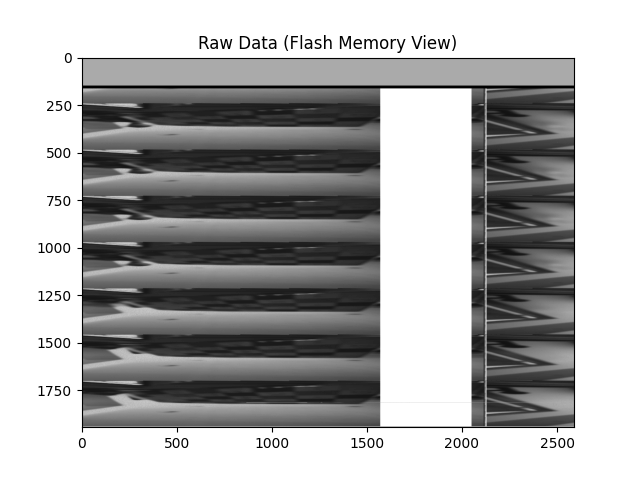

In [6]:
# Build raw image:
lines_data = reloaded_img.assemble(equalize_lengths=True, pad_byte=b'\xAA')
lines_data_orig_copy = [x for x in lines_data]  # Copy of source to compare against
lines_arr = [[int(x) for x in l] for l in lines_data]
raw_img = np.array(lines_arr, dtype=np.uint8)
plt.figure()
plt.imshow(raw_img, cmap='gray')
plt.title('Raw Data (Flash Memory View)')
plt.show()

In [7]:
# Use Aptina-style (bayer-preserving) binning as a method of acceptably lossless compression:
# Do this in-place:
# Impl. in a way that's easily translatable to C++

def bin_section(line: bytes, start_idx: int, n_bin: int) -> Tuple[int, int]:
    # Bins a section of line 2*n_bin wide into two bytes, starting at start_idx (inclusive):
    # Impl. in a way that's easily translatable to C++
    byte_1: int = 0 # U16
    byte_2: int = 0 # U16
    # Collect all the bytes to be binned:
    for i in range(n_bin):
        byte_1 += line[start_idx+i*2]
        byte_2 += line[start_idx+i*2+1]
    # Perform average:
    byte_1 = (byte_1 // n_bin)
    byte_2 = (byte_2 // n_bin)
    return (byte_1 & 0xFF, byte_2 & 0xFF)

LEN_OF_LINE_HEADER = 15  # Bytes
LEN_OF_FRAME_HEADER_DATA = 84 # Bytes

def unbin_section(binned_bytes: bytes, n_bin: int) -> bytes:
    # Expands the given two bytes by `n_bin`
    # Impl. in a way that's easily translatable to C++
    return binned_bytes * n_bin

def line_header_starts_at_idx(line: bytes, idx: int) -> bool:
    # Checks if a line header starts at the given index:
    if( idx + LEN_OF_LINE_HEADER > len(line) ):
        return False  # can't, not enough space
    # Line header follows pattern: b'\x11\x22\x33.{1}\x55\x66\x77.{1}\x99\xAA\xBB.{1}\xDD\xEE\xFF'
    return (
        line[idx + 0x00] == 0x11 and
        line[idx + 0x01] == 0x22 and
        line[idx + 0x02] == 0x33 and
        # line[idx + 0x03] == 0x44 and  # data goes here
        line[idx + 0x04] == 0x55 and
        line[idx + 0x05] == 0x66 and
        line[idx + 0x06] == 0x77 and
        # line[idx + 0x07] == 0x88 and  # data goes here
        line[idx + 0x08] == 0x99 and
        line[idx + 0x09] == 0xAA and
        line[idx + 0x0A] == 0xBB and
        # line[idx + 0x0B] == 0xCC and  # data goes here
        line[idx + 0x0C] == 0xDD and
        line[idx + 0x0D] == 0xEE and
        line[idx + 0x0E] == 0xFF
    )

def frame_header_starts_at_idx(line: bytes, idx: int) -> bool:
    # Checks if a line header starts at the given index:
    if( idx + LEN_OF_FRAME_HEADER_DATA > len(line) ):
        return False  # can't, not enough space
    # Frame header follow pattern:  b"IRIS-FPGA-FW--RC.{1}\..{1}\..{1}--SENSOR-FRAME-NUM:.{1}--INTERLEAVED-FRAME-NUM:.{1}--IMAGING-MODE:.{1}--"
    # Example: "IRIS-FPGA-FW--RCX.X.X--SENSOR-FRAME-NUM:X--INTERLEAVED-FRAME-NUM:X--IMAGING-MODE:X--"
    # We don't have to check the whole thing, just enough bytes to be sure
    # we're not looking at a chance occurance in noise:
    return line[idx:idx+14] == b"IRIS-FPGA-FW--"


def find_header_start_in_section(line: bytes, start_idx: int, n_bytes: int) -> int:
    # Check if any of the bytes in the given section are the start of a line or frame header.
    # That is, this checks if the given section of `n_bytes` starting at `start_idx`
    # contains all or part of a line or frame header.
    # If a header is contained in the given section, the index of the first
    # byte of the header is returned.
    # If no header start is found, -1 is returned.
    contains_header: bool = False
    
    i: int = 0
    while (i < n_bytes and not contains_header):
        if(line_header_starts_at_idx(line, start_idx+i)):
            contains_header = True
        elif(frame_header_starts_at_idx(line, start_idx+i)):
            contains_header = True
        else:
            i += 1

    return start_idx+i if contains_header else -1


def bin_line(n_bin: int, line: bytes | bytearray) -> Tuple[bytes, int]:
    # Performs a bayer-preserving binning operation on the given line.
    # Preserves any line or frame headers encountered.
    # Does this in-place (requires no extra memory).
    # Returns pointer to line and number of bytes in the line which are actually used.

    line = bytearray(line)  # make it mutable

    n_binX2 = n_bin*2  # precompute

    # Index where we're currently reading:
    read_idx: int = 0
    # Number of sections we've binned:
    N_binned: int = 0  # U16
    # Where we're currently writing N_binned (it moves if we have to jump around a header):
    # NOTE: This is U16 so this is the idx of the 1st byte
    N_binned_idx: int = 1
    # Index where we're currently writing (need to leave 3 bytes free at the beginning for binning data):
    write_idx: int = N_binned_idx + 2
    
    while read_idx < len(line):
        header_start_idx = find_header_start_in_section(line, read_idx, n_binX2)

        if(header_start_idx < 0):
            # No header in this section. Perform normal binning:
            binned = bin_section(line, read_idx, n_bin)
            line[write_idx] = binned[0]
            line[write_idx+1] = binned[1]
            N_binned += 1
            # Bump the indices:
            read_idx += n_binX2
            write_idx += 2
        else:
            # Copy all of the remaining bytes before the header and all the bytes in the header:
            # Copy the header:
            header_len: int = LEN_OF_LINE_HEADER if (line[header_start_idx] == 0x11) else LEN_OF_FRAME_HEADER_DATA
            n_bytes_to_copy: int = header_start_idx - read_idx + header_len
            line[write_idx:write_idx+n_bytes_to_copy] = line[read_idx:read_idx+n_bytes_to_copy]
            # Advance read index:
            read_idx += n_bytes_to_copy
            # Apply Nbinned to its previous location, advance its index to after the header, and reset it:
            line[N_binned_idx] = N_binned & 0xFF
            line[N_binned_idx+1] = (N_binned >> 8) & 0xFF
            N_binned = 0
            N_binned_idx = write_idx + n_bytes_to_copy
            # Jump to writing after N_binned:
            write_idx = N_binned_idx + 2

        # If the number of bytes left after all that isn't enough for binning,
        # just copy them directly:
        bytes_left: int = len(line) - read_idx  # I16 (so it can be neg)
        if(bytes_left < n_binX2):
            line[write_idx:write_idx+bytes_left] = line[read_idx:read_idx+bytes_left]
            write_idx += bytes_left  # ack that we wrote these bytes
            read_idx = len(line)  # we've read everything

    # At end, apply metadata about binning process:
    line[0] = n_bin
    line[N_binned_idx] = N_binned & 0xFF
    line[N_binned_idx+1] = (N_binned >> 8) & 0xFF

    return (bytes(line), write_idx)


def unbin_line(line: bytes | bytearray) -> bytes:
    # Reverses bayer-preserving binning on a line, restoring it to its original
    # length and approximately the same contents, with all line and frame
    # headers preserved.
    # Only ever run on GSW so doesn't need to be written to be easily translatable.
    # Extract metadata:
    n_bin = line[0]  # grab the n_bin setting
    # Where the data about the current set of binned sections is:
    N_binned_idx = 1
    read_idx = N_binned_idx + 2 # start reading after header info

    full_line = b''

    while read_idx < len(line):
        # Expand N_binned sections:
        N_binned = line[N_binned_idx] | (line[N_binned_idx+1] << 8)
        for _ in range(N_binned):
            # Unbin every 2 bytes:
            full_line += unbin_section(line[read_idx:read_idx+2], n_bin)
            read_idx += 2
        # See if there's a header in the rest of this:
        header_start_idx = find_header_start_in_section(line, read_idx, len(line)-read_idx)
        if header_start_idx < 0:
            # No header in what's left and binning is over, so just copy the rest:
            full_line += line[read_idx:]
            read_idx = len(line)  # we've read everything
        else:
            # There's a header upcoming which is why binning stopped...
            # Copy over everything through the header (incl. anything left before it):
            header_len = LEN_OF_LINE_HEADER if (line[header_start_idx] == 0x11) else LEN_OF_FRAME_HEADER_DATA
            full_line += line[read_idx:header_start_idx+header_len]
            # Set the N_binned_idx to right after the header:
            N_binned_idx = header_start_idx + header_len
            # and the read index to right after that:
            read_idx = N_binned_idx + 2

    return full_line
    

In [8]:
def line_is_homogeneous(line: bytes) -> bool:
    # Returns whether the line contains all of the same value:
    is_homogeneous: bool = True
    i: int = 1
    while(is_homogeneous and i < len(line)):
        is_homogeneous = is_homogeneous and (line[i] == line[0])
        i += 1
    return is_homogeneous

In [9]:
# Define "compression" as a two-stage process of binning and heatshrinking:
# Impl. in a way that's easily translatable to C++
import heatshrink2 as hs2

# Default binning amount:
N_BIN_DEFAULT: Final[int] = 7
# Heatshrink settings, shown by heatshrink test sandbox to be optimal values
# for our images:
HS_WINDOW: Final[int] = 10
HS_LOOKAHEAD: Final[int] = 3

def compress(line: bytes, n_bin: int=N_BIN_DEFAULT, heatshrink: bool=True) -> bytes:
    # Bin and heatshrink. Also RLE homogeneous lines.
    # Impl. in a way that's easily translatable to C++
    line = bytearray(line)  # make it mutable
    line_len: int = len(line)
    if(line_is_homogeneous(line)):
        # If Line is all 1 value, replace with:
        # b"ALL" + (U16 num bytes) + char to repeat (really basic RLE)
        line[0:3] = b"ALL"
        line[3] = line_len & 0xFF
        
        line[4] = (line_len >> 8) & 0xFF
        line[5] = line[5]
        line_len = 6
        line = line[:line_len]
    else:
        # Bin Line:
        line, line_len = bin_line(n_bin, line)
        line = line[:line_len]

        # Heatshrink Line (heatshrink test sandbox showed these settings to be
        # optimal values for our images):
        if heatshrink:
            compressed = hs2.compress(line, window_sz2=HS_WINDOW, lookahead_sz2=HS_LOOKAHEAD)
            compressed_len = len(compressed)

        # Only downlink compressed version if compression helped:
        if heatshrink and compressed_len < line_len:
            line = b'\xFF' + compressed  # flag as compressed
            line_len = compressed_len + 1
        else:
            line = b'\x00' + line  # flag as not compressed
            line_len = line_len + 1

    return bytes(line[:line_len])


def decompress(line: bytes) -> bytes:
    # Unheatshrink & debin. Handle RLE for homogeneous lines.
    # Doesn't need to be easily translatable to C++ since this will always be
    # run on GSW.
    line = bytearray(line)  # make it mutable
    if line[:3] == b"ALL" and len(line) == 6:
        # A homogeneous line that was RLE'd:
        line_len = (line[4] << 8) | line[3]
        line = line[5:6] * line_len
    else:
        # Decompress (if necessary):
        if(line[0] == 0xFF):
            line = hs2.decompress(line[1:], window_sz2=HS_WINDOW, lookahead_sz2=HS_LOOKAHEAD)
        else:
            line = line[1:]
        # Unbin:
        line = unbin_line(line)
    return bytes(line)
        

In [10]:
# Compress:
lines_compressed = [compress(ld) for ld in lines_data]
orig_size = sum(len(ld) for ld in lines_data)
comp_size = sum(len(cld) for cld in lines_compressed)
# Statistics:
{
    'comp_size': f"{comp_size/1e3:.1f}kB",
    'orig_size': f"{orig_size/1e3:.1f}kB",
    'compression_factor': f"{100 * comp_size / orig_size:.1f}%",
    'downlink_time': f"{orig_size * 3.5/243/2592:.1f}min -> {comp_size * 3.5/243/2592:.1f}min",
    'equivalent_line_count': f"{orig_size/2592:.0f}lines -> {comp_size/2592:.0f}equiv.-lines"
}

{'comp_size': '575.5kB',
 'orig_size': '5038.8kB',
 'compression_factor': '11.4%',
 'downlink_time': '28.0min -> 3.2min',
 'equivalent_line_count': '1944lines -> 222equiv.-lines'}

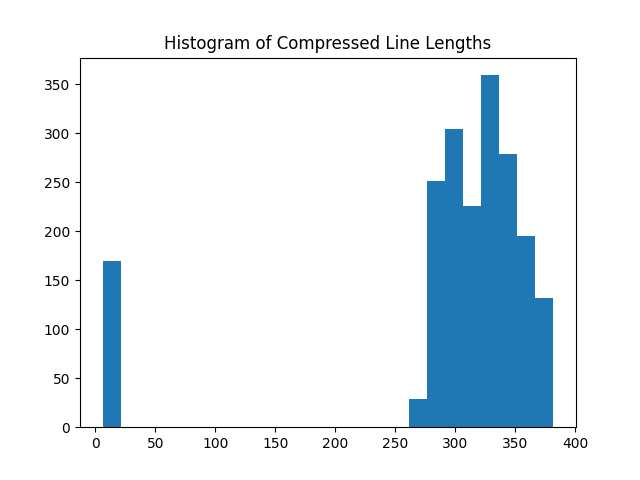

In [11]:
# Histogram of compressed line lengths:
compressed_line_lengths = [len(cld) for cld in lines_compressed]
plt.figure()
plt.hist(compressed_line_lengths, bins=25)
plt.title('Histogram of Compressed Line Lengths')
plt.show()

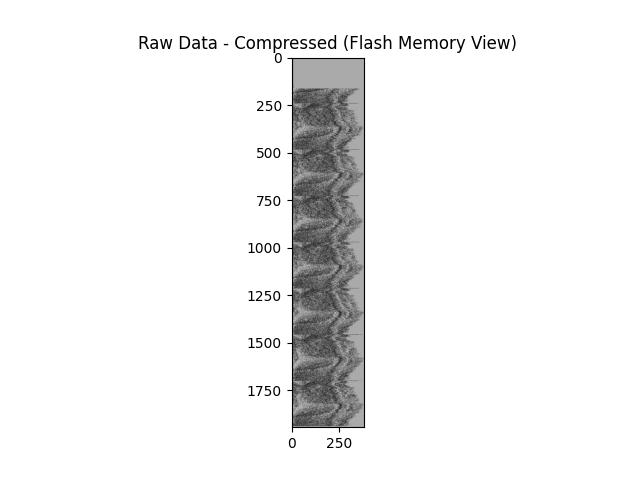

In [12]:
# Test Image of What Compressed Data looks like as an Image (for fun):
lines_data_comp_img = [bytes([x for x in line]) for line in lines_compressed]  # copy

# Pad all lines out to the same length:
pad_byte = b'\xAA'
max_len = max(len(line_data) for line_data in lines_data_comp_img)
for i, line_data in enumerate(lines_data_comp_img):
    size = len(line_data)
    diff = max_len - size
    if diff > 0:
        lines_data_comp_img[i] = line_data + pad_byte*diff

# Rebuild raw image:
lines_arr = [ [int(x) for x in l] for l in lines_data_comp_img ]
raw_img = np.array(lines_arr, dtype=np.uint8)
plt.figure()
plt.imshow(raw_img, cmap='gray')
plt.title('Raw Data - Compressed (Flash Memory View)')
plt.show()

In [13]:
# Decompress (can't check equality b/c they won't be equal, just approx)
lines_decompressed = [decompress(cld) for cld in lines_compressed]

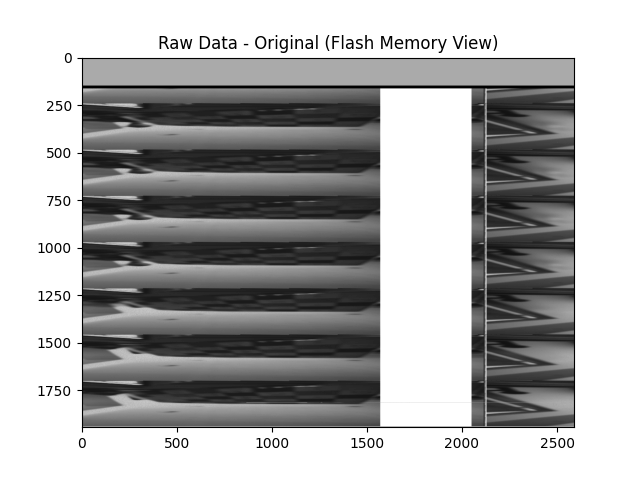

In [14]:
## Redisplay Source Memory:
# Test Image of What Compressed Data looks like as an Image (for fun):
lines_data_copy = [bytes([x for x in line]) for line in lines_data]  # copy

# Pad all lines out to the same length:
pad_byte = b'\xAA'
max_len = max(len(line_data) for line_data in lines_data_copy)
for i, line_data in enumerate(lines_data_copy):
    size = len(line_data)
    diff = max_len - size
    if diff > 0:
        lines_data_copy[i] = line_data + pad_byte*diff

# Rebuild raw image:
lines_arr = [ [int(x) for x in l] for l in lines_data_copy ]
raw_img = np.array(lines_arr, dtype=np.uint8)
plt.figure()
plt.imshow(raw_img, cmap='gray')
plt.title('Raw Data - Original (Flash Memory View)')
plt.show()

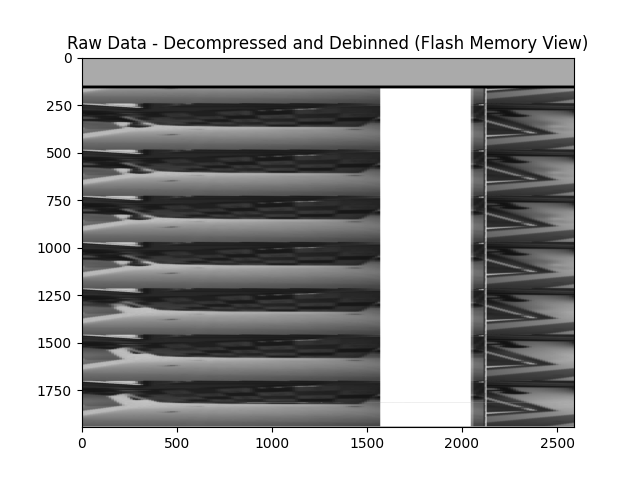

In [15]:
## Display Reconstructed Memory:
# Test Image of What Compressed Data looks like as an Image (for fun):
lines_data_copy = [bytes([x for x in line]) for line in lines_decompressed]  # copy

# Pad all lines out to the same length:
pad_byte = b'\xAA'
max_len = max(len(line_data) for line_data in lines_data_copy)
for i, line_data in enumerate(lines_data_copy):
    size = len(line_data)
    diff = max_len - size
    if diff > 0:
        lines_data_copy[i] = line_data + pad_byte*diff

# Rebuild raw image:
lines_arr = [ [int(x) for x in l] for l in lines_data_copy ]
raw_img = np.array(lines_arr, dtype=np.uint8)
plt.figure()
plt.imshow(raw_img, cmap='gray')
plt.title('Raw Data - Decompressed and Debinned (Flash Memory View)')
plt.show()

In [16]:
# Build an image of using each:
import scripts.testing.rc11_image_toolkit as img11
import PIL.Image
import time

FrameMetadataRc11(fw_versions=Counter({'RC11.00.03': 7}), sensor_frame_nums=[2, 3, 4, 5, 6, 7, 8], interleaved_frame_nums=[1, 2, 3, 4, 5, 6, 7], imaging_mode=Counter({254: 7}))


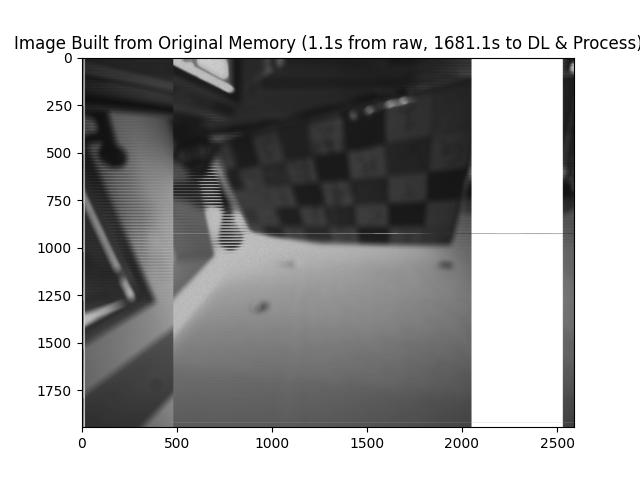

In [17]:
## Build Image using Original Memory:
start_sec = time.time()
image_data = img11.extract_image_from_flash_memory(b''.join(lines_data))
print(image_data.frame_metadata)
image = image_data.quick_build()
end_sec = time.time()
est_dl_n_processing_time = sum(len(x) for x in lines_data) * 3.5/243/2592*60 + (end_sec - start_sec)
plt.figure()
plt.imshow(image, cmap='gray')
plt.title(f'Image Built from Original Memory ({end_sec-start_sec:.01f}s from raw, {est_dl_n_processing_time:.1f}s to DL & Process)')
plt.show()

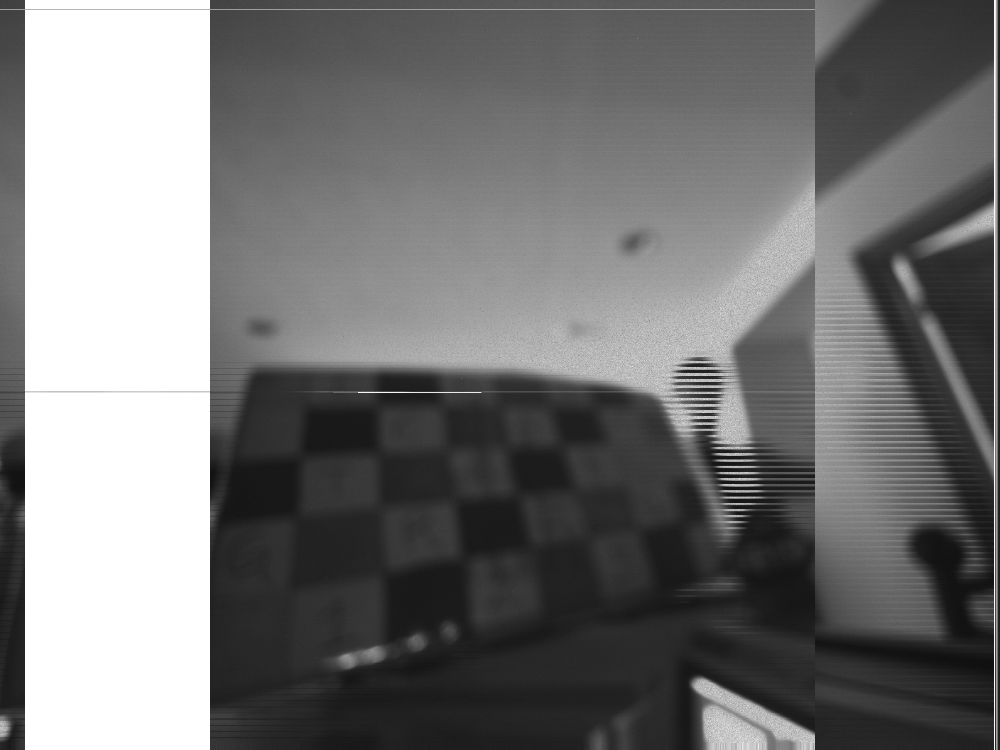

In [18]:
PIL.Image.fromarray(image.astype('uint8'), 'L').rotate(180)

FrameMetadataRc11(fw_versions=Counter({'RC11.00.03': 7}), sensor_frame_nums=[2, 3, 4, 5, 6, 7, 8], interleaved_frame_nums=[1, 2, 3, 4, 5, 6, 7], imaging_mode=Counter({254: 7}))


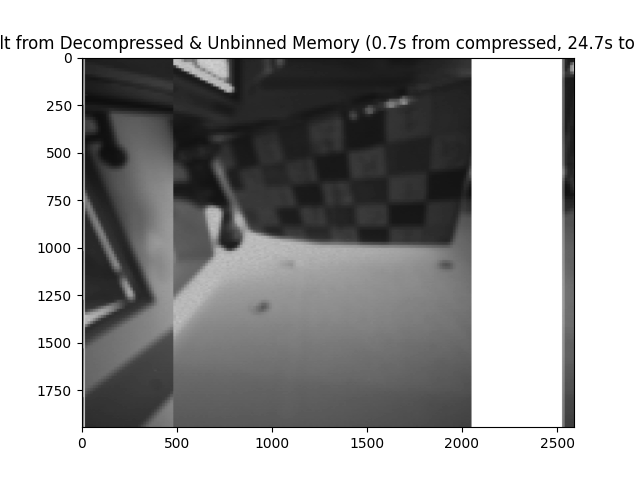

In [19]:
## Build Image using Rebuilt (Decompressed & Unbinned) Memory:
start_sec = time.time()
lines_decompressed = [decompress(cld) for cld in lines_compressed]
image_data_rebuilt = img11.extract_image_from_flash_memory(b''.join(lines_decompressed))
image = image_data_rebuilt.quick_build(keep_frame_indices=[1])
print(image_data_rebuilt.frame_metadata)
end_sec = time.time()
est_dl_n_processing_time = sum(len(x) for x in lines_compressed)/8 * 3.5/243/2592*60 + (end_sec - start_sec)
plt.figure()
plt.imshow(image, cmap='gray')
plt.title(f'1 Frame Built from Decompressed & Unbinned Memory ({end_sec-start_sec:.01f}s from compressed, {est_dl_n_processing_time:.1f}s to DL & Process)')
plt.show()

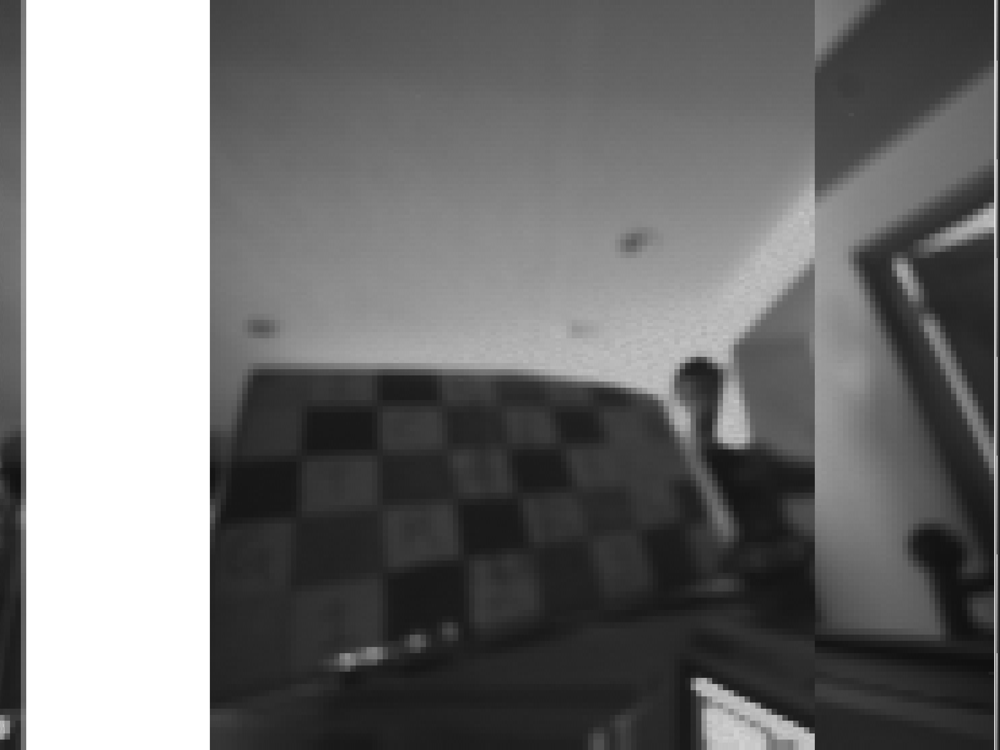

In [20]:
PIL.Image.fromarray(image.astype('uint8'), 'L').rotate(180)

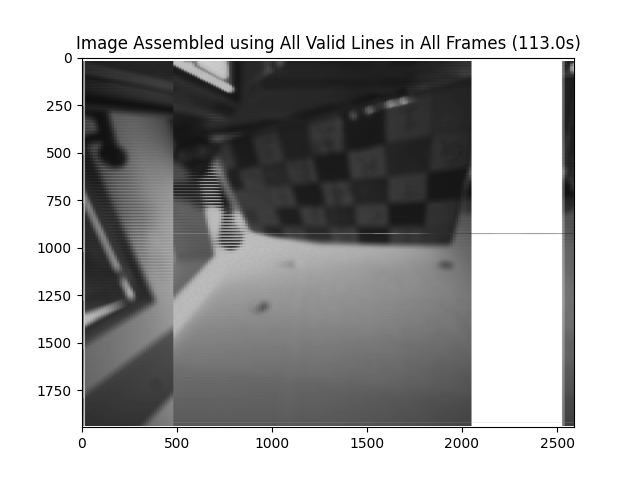

In [21]:
# Intelligently build a whole image from all valid lines in all frames:
start_sec = time.time()
full_image = image_data_rebuilt.smart_build()
end_sec = time.time()

plt.figure()
plt.imshow(full_image, cmap='gray')
plt.title(f'Image Assembled using All Valid Lines in All Frames ({end_sec-start_sec:.01f}s)')
plt.show()

## Median & Mean of Frame Stack:

/Users/connorcolombo/.pyenv/versions/3.10.8/envs/py_irisbackendv3/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,


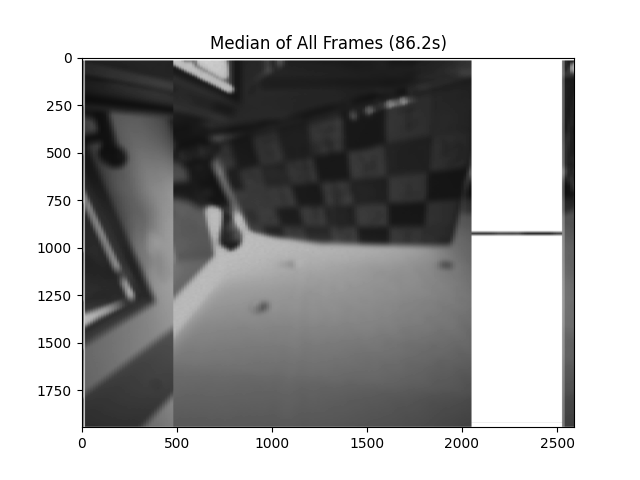

In [22]:
start_sec = time.time()
median_of_frames = image_data_rebuilt.build_median_frame()
end_sec = time.time()

plt.figure()
plt.imshow(median_of_frames, cmap='gray')
plt.title(f"Median of All Frames ({end_sec-start_sec:.01f}s)")
plt.show()

In [23]:
## GIF of Frames (in case motion was captured):
gif_name = image_pickle_file.replace(".pkl", ".compressed.gif")
start_sec = time.time()
image_data_rebuilt.save_frames_gif(gif_name, rotation=0, unknown_cutoff=0.25)
end_sec = time.time()
f"GIF Build Time: {end_sec-start_sec:.01f}s"

'GIF Build Time: 0.7s'


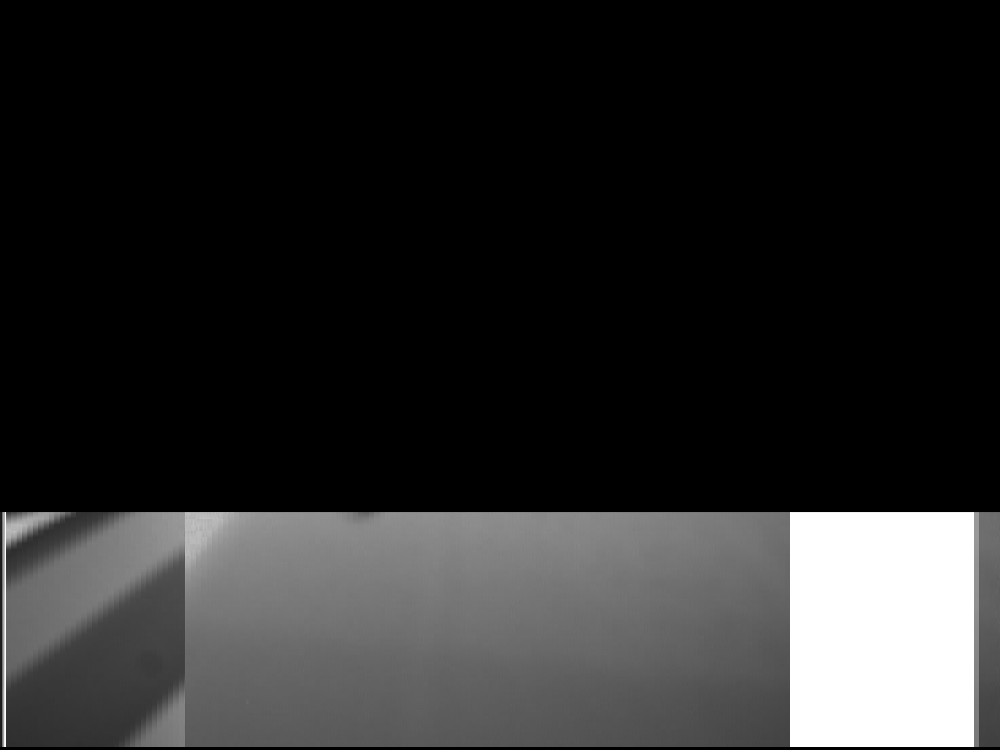

In [24]:
# Diplay Saved GIF (encode as b64 so it gets saved inside the notebook):
import IPython.display, base64
b64 = base64.b64encode(open(gif_name,'rb').read()).decode('ascii')
IPython.display.display(IPython.display.HTML(f'<img src="data:image/gif;base64,{b64}" />'))

## Summary of Key Images:

### Full "Smart Build" Interpolated Image:

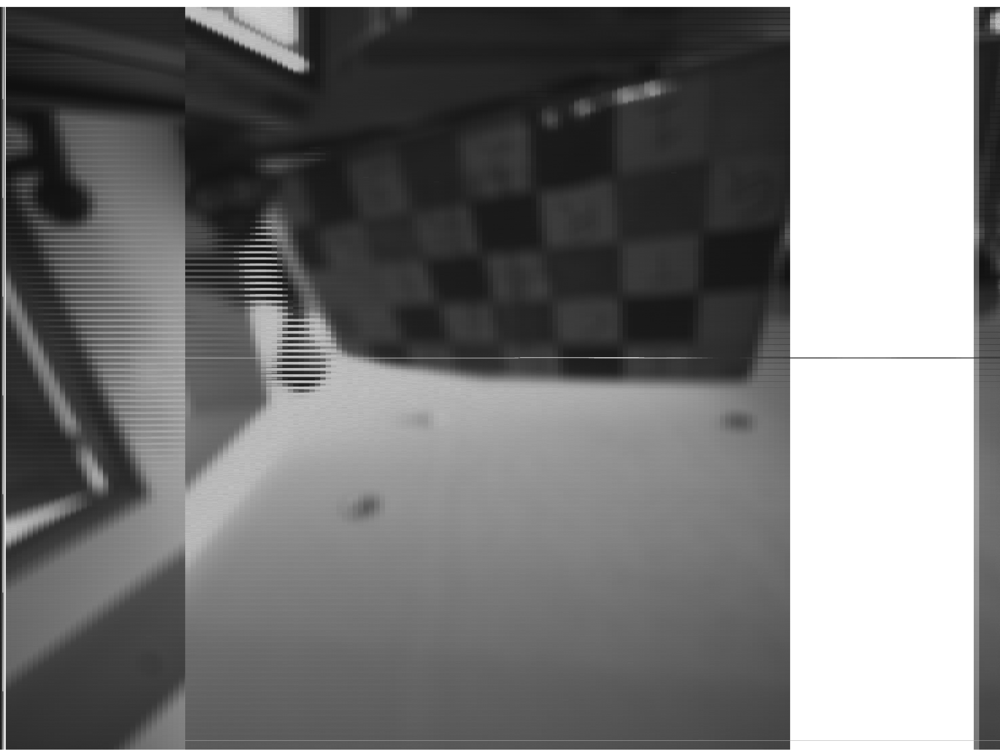

In [25]:
full_image[np.isnan(full_image)] = 0xFF  # just in case
PIL.Image.fromarray(full_image.astype('uint8'), 'L').rotate(0)

### Median of All (Interpolated) Frames:

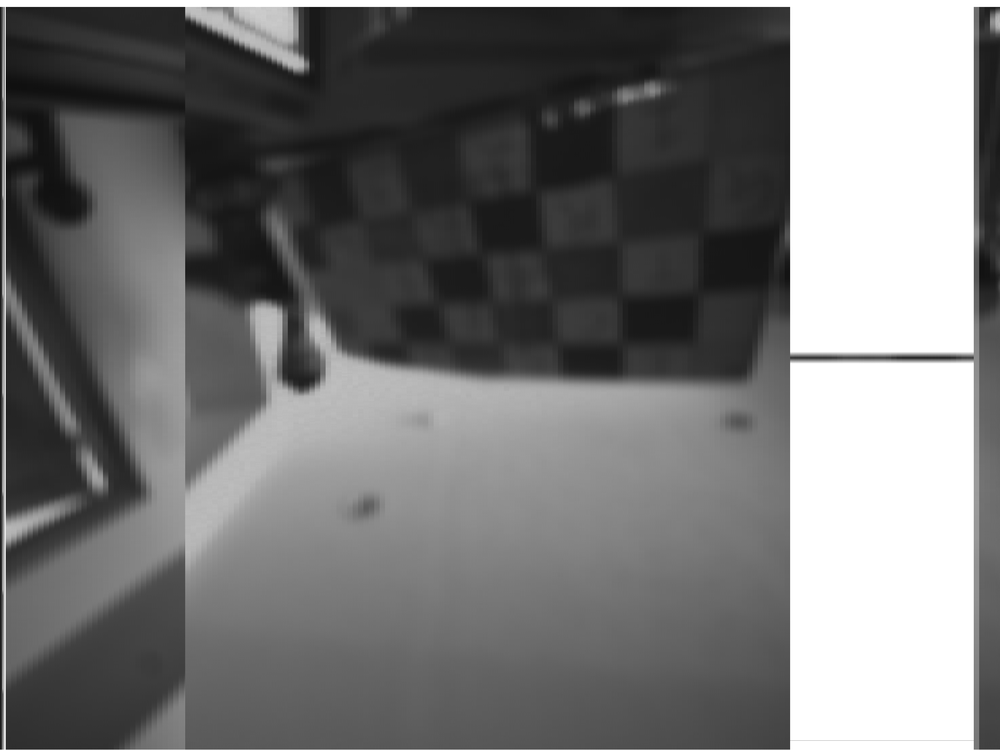

In [26]:
PIL.Image.fromarray(median_of_frames.astype('uint8'), 'L').rotate(0)

### All Frames:

NameError: name 'frames' is not defined

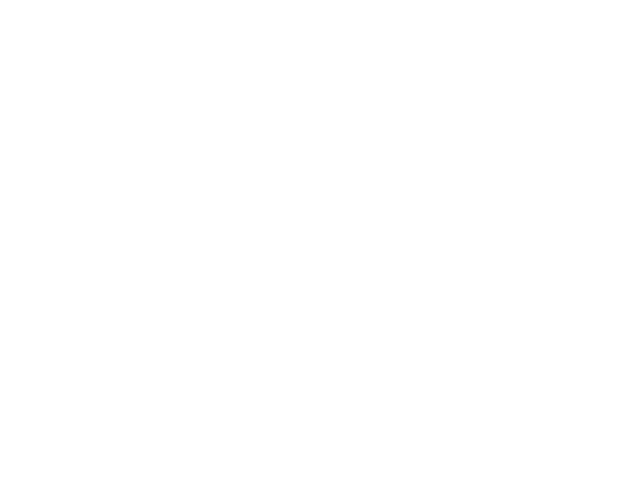

In [27]:
from mpl_toolkits.axes_grid1 import ImageGrid

fig = plt.figure()
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(len(frames)//2+1, 2),
                 axes_pad=0.1,  # pad between axes in inch.
                 )

for ax, im in zip(grid, frames):
    ax.imshow(im, cmap='gray')
plt.show()